# Machine Learning Assignment


## Loading the dataset

In [20]:
import pandas as pd
import numpy as np 
import pandas as pd 
import seaborn as sns 
import matplotlib.pyplot as plt 

from scipy.stats import norm 

df = pd.read_csv('data/breast-cancer.csv')
df.count()

ID                            568
Radius (Mean)                 550
Texture (Mean)                568
Perimeter (Mean)              567
Area (Mean)                   566
Smoothness (Mean)             567
Compactness (Mean)            566
Concavity (Mean)              569
Concave Points (Mean)         569
Symmetry (Mean)               566
Fractal Dimension (Mean)      567
Radius (Error)                551
 Texture (Error)              567
 Perimeter (Error)            568
 Area (Error)                 567
 Smoothness (Error)           566
 Compactness (Error)          568
 Concavity (Error)            568
 Concave Points (Error)       567
 Symmetry (Error)             568
 Fractal Dimension (Error)    567
 Radius (Worst)               551
 Texture (Worst)              566
 Perimeter (Worst)            567
 Area (Worst)                 566
 Smoothness (Worst)           569
 Compactness (Worst)          565
 Concavity (Worst)            567
Concave Points (Worst)        566
Symmetry (Wors

In [21]:
df.head()

,ID,Radius (Mean),Texture (Mean),Perimeter (Mean),Area (Mean),Smoothness (Mean),Compactness (Mean),Concavity (Mean),Concave Points (Mean),Symmetry (Mean),...,Texture (Worst),Perimeter (Worst),Area (Worst),Smoothness (Worst),Compactness (Worst),Concavity (Worst),Concave Points (Worst),Symmetry (Worst),Fractal Dimension (Worst),Diagnosis
0,842302.0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,NaN,0.4601,0.11890,M
1,842517.0,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,M
2,84300903.0,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,M
3,84348301.0,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,M
4,84358402.0,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,M


In [22]:
df.tail(10)

,ID,Radius (Mean),Texture (Mean),Perimeter (Mean),Area (Mean),Smoothness (Mean),Compactness (Mean),Concavity (Mean),Concave Points (Mean),Symmetry (Mean),...,Texture (Worst),Perimeter (Worst),Area (Worst),Smoothness (Worst),Compactness (Worst),Concavity (Worst),Concave Points (Worst),Symmetry (Worst),Fractal Dimension (Worst),Diagnosis
559,925291.0,11.51,23.93,74.52,403.5,0.09261,0.10210,0.11120,0.04105,0.1388,...,37.16,82.28,474.2,0.12980,0.25170,0.3630,0.09653,0.2112,0.08732,B
560,925292.0,14.05,27.15,91.38,600.4,0.09929,0.11260,0.04462,0.04304,0.1537,...,33.17,100.20,706.7,0.12410,0.22640,0.1326,0.10480,0.2250,0.08321,B
561,925311.0,11.20,29.37,70.67,386.0,0.07449,0.03558,0.00000,0.00000,0.1060,...,38.30,75.19,439.6,0.09267,0.05494,0.0000,0.00000,0.1566,0.05905,B
562,925622.0,15.22,30.62,103.40,716.9,0.10480,0.20870,0.25500,0.09429,0.2128,...,42.79,128.70,915.0,0.14170,0.79170,1.1700,0.23560,0.4089,0.14090,M
563,926125.0,20.92,25.09,143.00,1347.0,0.10990,0.22360,0.31740,0.14740,0.2149,...,29.41,179.10,1819.0,0.14070,0.41860,0.6599,0.25420,0.2929,0.09873,M
564,926424.0,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.22160,0.2060,0.07115,M
565,926682.0,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.16280,0.2572,0.06637,M
566,926954.0,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.14180,0.2218,0.07820,M
567,927241.0,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.26500,0.4087,0.12400,M
568,92751.0,7.76,24.54,47.92,181.0,0.05263,0.04362,0.00000,0.00000,0.1587,...,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.00000,0.2871,0.07039,B


In [24]:
print("\nInfo about the class\n")
print(df['Diagnosis'].describe(),"\n")


Info about the class

count     569
unique      2
top         B
freq      358
Name: Diagnosis, dtype: object 



In [222]:
print("Shape:",df.shape)
print()
print(df.info())
print()
print(df.describe())

Shape: (569, 32)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 569 entries, 284 to 0
Data columns (total 32 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          568 non-null    float64
 1   Radius (Mean)               550 non-null    float64
 2   Texture (Mean)              568 non-null    float64
 3   Perimeter (Mean)            567 non-null    float64
 4   Area (Mean)                 566 non-null    float64
 5   Smoothness (Mean)           567 non-null    float64
 6   Compactness (Mean)          566 non-null    float64
 7   Concavity (Mean)            569 non-null    float64
 8   Concave Points (Mean)       569 non-null    float64
 9   Symmetry (Mean)             566 non-null    float64
 10  Fractal Dimension (Mean)    567 non-null    float64
 11  Radius (Error)              551 non-null    float64
 12   Texture (Error)            567 non-null    float64
 13   Perimeter (Error

In [284]:
df.iloc[:, 10].max()

0.09744

In [260]:
df.mode(numeric_only=True)

,ID,Radius (Mean),Texture (Mean),Perimeter (Mean),Area (Mean),Smoothness (Mean),Compactness (Mean),Concavity (Mean),Concave Points (Mean),Symmetry (Mean),...,Radius (Worst),Texture (Worst),Perimeter (Worst),Area (Worst),Smoothness (Worst),Compactness (Worst),Concavity (Worst),Concave Points (Worst),Symmetry (Worst),Fractal Dimension (Worst)
0,8670.0,12.34,14.93,82.61,512.2,0.1007,0.1147,0.0,0.0,0.1601,...,12.36,17.70,101.7,284.4,0.1216,0.1486,0.0,0.0,0.2226,0.07427
1,8913.0,NaN,15.70,87.76,NaN,NaN,0.1206,NaN,NaN,0.1714,...,NaN,27.26,105.9,402.8,0.1223,0.3416,NaN,NaN,0.2369,NaN
2,8915.0,NaN,16.84,134.70,NaN,NaN,NaN,NaN,NaN,0.1717,...,NaN,NaN,117.7,439.6,0.1234,NaN,NaN,NaN,0.2383,NaN
3,9047.0,NaN,16.85,NaN,NaN,NaN,NaN,NaN,NaN,0.1769,...,NaN,NaN,NaN,458.0,0.1256,NaN,NaN,NaN,0.2972,NaN
4,85715.0,NaN,17.46,NaN,NaN,NaN,NaN,NaN,NaN,0.1893,...,NaN,NaN,NaN,472.4,0.1275,NaN,NaN,NaN,0.3109,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
563,911157302.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
564,911296201.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
565,911296202.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
566,911320501.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [173]:
print(dataset['Diagnosis'].value_counts())

B    358
M    211
Name: Diagnosis, dtype: int64


In [174]:
df.isnull().sum() 

ID                             1
Radius (Mean)                 19
Texture (Mean)                 1
Perimeter (Mean)               2
Area (Mean)                    3
Smoothness (Mean)              2
Compactness (Mean)             3
Concavity (Mean)               0
Concave Points (Mean)          0
Symmetry (Mean)                3
Fractal Dimension (Mean)       2
Radius (Error)                18
 Texture (Error)               2
 Perimeter (Error)             1
 Area (Error)                  2
 Smoothness (Error)            3
 Compactness (Error)           1
 Concavity (Error)             1
 Concave Points (Error)        2
 Symmetry (Error)              1
 Fractal Dimension (Error)     2
 Radius (Worst)               18
 Texture (Worst)               3
 Perimeter (Worst)             2
 Area (Worst)                  3
 Smoothness (Worst)            0
 Compactness (Worst)           4
 Concavity (Worst)             2
Concave Points (Worst)         3
Symmetry (Worst)               3
Fractal Di

In [25]:
df.drop([203, 433, 549])
df = df.fillna(df.mean())
df.isnull().sum()

ID                            0
Radius (Mean)                 0
Texture (Mean)                0
Perimeter (Mean)              0
Area (Mean)                   0
Smoothness (Mean)             0
Compactness (Mean)            0
Concavity (Mean)              0
Concave Points (Mean)         0
Symmetry (Mean)               0
Fractal Dimension (Mean)      0
Radius (Error)                0
 Texture (Error)              0
 Perimeter (Error)            0
 Area (Error)                 0
 Smoothness (Error)           0
 Compactness (Error)          0
 Concavity (Error)            0
 Concave Points (Error)       0
 Symmetry (Error)             0
 Fractal Dimension (Error)    0
 Radius (Worst)               0
 Texture (Worst)              0
 Perimeter (Worst)            0
 Area (Worst)                 0
 Smoothness (Worst)           0
 Compactness (Worst)          0
 Concavity (Worst)            0
Concave Points (Worst)        0
Symmetry (Worst)              0
Fractal Dimension (Worst)     0
Diagnosi

<AxesSubplot:>

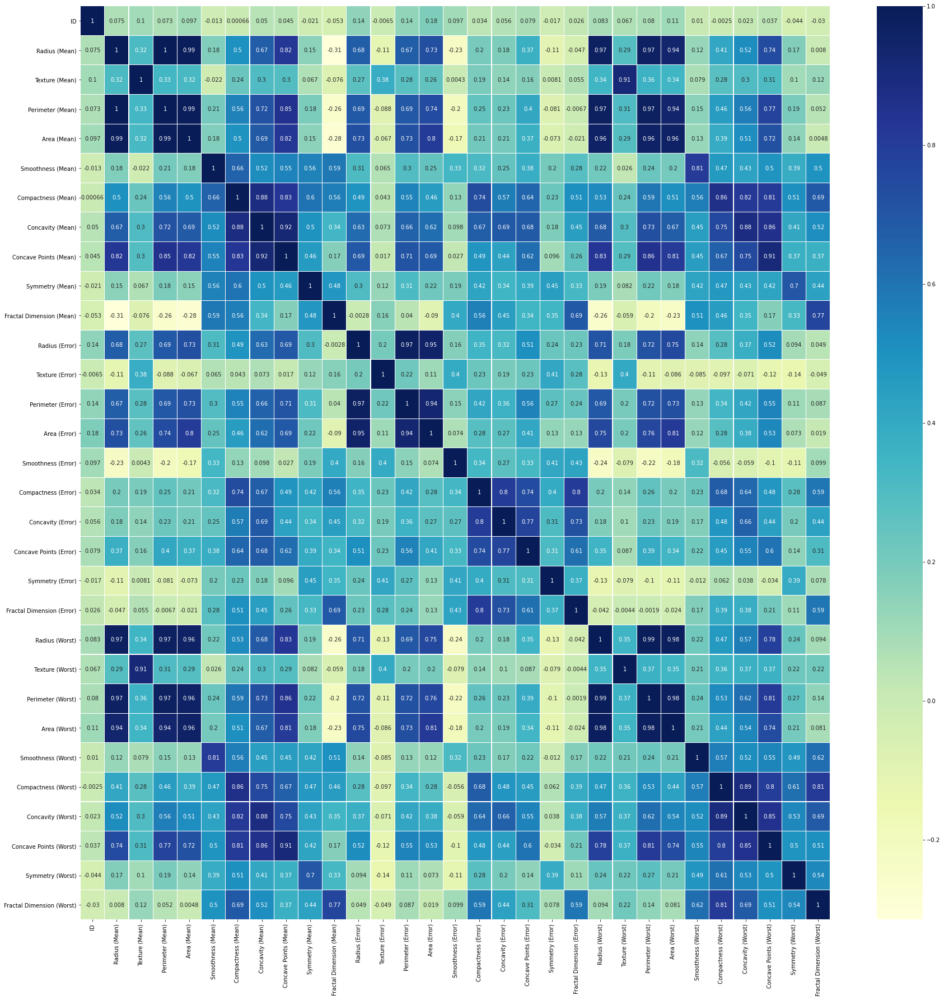

In [175]:
corrmat = df.corr() 
  
f, ax = plt.subplots(figsize =(30, 30)) 
sns.heatmap(corrmat, ax = ax, cmap ="YlGnBu", linewidths = 0.1, annot=True)

In [176]:
df.duplicated(subset=None, keep='first')

284    False
371    False
367    False
364    False
363    False
       ...  
379    False
141    False
385    False
389    False
0      False
Length: 569, dtype: bool

In [177]:
df.sort_values("Diagnosis", inplace = True) 
  
# making a bool series 
bool_series = df["Diagnosis"].duplicated() 
  
# displaying data 
df.head()
  
# display data 
df[bool_series] 

,ID,Radius (Mean),Texture (Mean),Perimeter (Mean),Area (Mean),Smoothness (Mean),Compactness (Mean),Concavity (Mean),Concave Points (Mean),Symmetry (Mean),...,Texture (Worst),Perimeter (Worst),Area (Worst),Smoothness (Worst),Compactness (Worst),Concavity (Worst),Concave Points (Worst),Symmetry (Worst),Fractal Dimension (Worst),Diagnosis
154,8711002.0,13.15,15.34,85.31,538.9,0.09384,0.08498,0.092930,0.034830,0.1822,...,20.50,97.67,677.3,0.14780,0.22560,0.300900,0.09722,0.3849,0.08633,B
155,8711003.0,12.25,17.94,78.27,460.3,0.08654,0.06679,0.038850,0.023310,0.1970,...,25.22,86.60,564.2,0.12170,0.17880,0.194300,0.08211,0.3113,0.08132,B
58,857810.0,13.05,19.31,82.61,527.2,0.08060,0.03789,0.000692,0.004167,0.1819,...,22.25,90.24,624.1,0.10210,0.06191,0.001845,0.01111,0.2439,0.06289,B
238,883270.0,14.22,27.85,92.55,623.9,0.08223,0.10390,0.110300,0.044080,0.1342,...,40.54,102.50,764.0,0.10810,0.24260,0.306400,0.08219,0.1890,0.07796,B
568,92751.0,7.76,24.54,47.92,181.0,0.05263,0.04362,0.000000,0.000000,0.1587,...,30.37,59.16,268.6,0.08996,0.06444,0.000000,0.00000,0.2871,0.07039,B
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64,85922302.0,12.68,23.84,82.69,499.0,0.11220,0.12620,0.112800,0.068730,0.1905,...,33.47,111.80,888.3,0.18510,0.40610,0.402400,0.17160,0.3383,0.10310,M
26,852763.0,14.58,21.53,97.41,644.8,0.10540,0.18680,0.142500,0.087830,0.2252,...,33.21,122.40,896.9,0.15250,0.66430,0.553900,0.27010,0.4264,0.12750,M
533,91930402.0,20.47,20.67,134.70,1299.0,0.09156,0.13130,0.152300,0.101500,0.2166,...,27.15,152.00,1645.0,0.10970,0.25340,0.309200,0.16130,0.3220,0.06386,M
28,852973.0,15.30,25.27,102.40,732.4,0.10820,0.16970,0.168300,0.087510,0.1926,...,36.71,149.30,1269.0,0.16410,0.61100,0.633500,0.20240,0.4027,0.09876,M


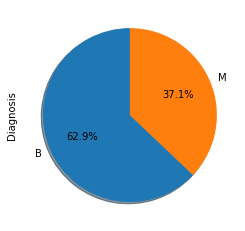

In [178]:
plt.figure();
df['Diagnosis'].value_counts().plot(kind="pie", subplots=True, shadow = True, startangle=90,
figsize=(15,10), autopct='%1.1f%%');

In [179]:
df.duplicated().value_counts()

False    569
dtype: int64

In [180]:
sum([True for idx,row in df.iterrows() if any(row.isnull())])

25

In [181]:
for i in range(len(df.index)) :
    print("Nan in row ", i , " : " ,  df.iloc[i].isnull().sum())

Nan in row  0  :  0
Nan in row  1  :  0
Nan in row  2  :  0
Nan in row  3  :  0
Nan in row  4  :  0
Nan in row  5  :  0
Nan in row  6  :  0
Nan in row  7  :  0
Nan in row  8  :  0
Nan in row  9  :  0
Nan in row  10  :  0
Nan in row  11  :  0
Nan in row  12  :  0
Nan in row  13  :  0
Nan in row  14  :  0
Nan in row  15  :  0
Nan in row  16  :  0
Nan in row  17  :  1
Nan in row  18  :  0
Nan in row  19  :  0
Nan in row  20  :  0
Nan in row  21  :  0
Nan in row  22  :  0
Nan in row  23  :  0
Nan in row  24  :  0
Nan in row  25  :  0
Nan in row  26  :  0
Nan in row  27  :  0
Nan in row  28  :  0
Nan in row  29  :  0
Nan in row  30  :  0
Nan in row  31  :  0
Nan in row  32  :  0
Nan in row  33  :  0
Nan in row  34  :  0
Nan in row  35  :  0
Nan in row  36  :  0
Nan in row  37  :  0
Nan in row  38  :  0
Nan in row  39  :  0
Nan in row  40  :  0
Nan in row  41  :  0
Nan in row  42  :  0
Nan in row  43  :  0
Nan in row  44  :  0
Nan in row  45  :  0
Nan in row  46  :  0
Nan in row  47  :  0
Na

Nan in row  517  :  0
Nan in row  518  :  0
Nan in row  519  :  0
Nan in row  520  :  0
Nan in row  521  :  0
Nan in row  522  :  0
Nan in row  523  :  0
Nan in row  524  :  0
Nan in row  525  :  0
Nan in row  526  :  0
Nan in row  527  :  0
Nan in row  528  :  0
Nan in row  529  :  0
Nan in row  530  :  0
Nan in row  531  :  0
Nan in row  532  :  0
Nan in row  533  :  0
Nan in row  534  :  0
Nan in row  535  :  0
Nan in row  536  :  0
Nan in row  537  :  3
Nan in row  538  :  0
Nan in row  539  :  0
Nan in row  540  :  0
Nan in row  541  :  0
Nan in row  542  :  0
Nan in row  543  :  3
Nan in row  544  :  0
Nan in row  545  :  0
Nan in row  546  :  0
Nan in row  547  :  0
Nan in row  548  :  0
Nan in row  549  :  0
Nan in row  550  :  0
Nan in row  551  :  3
Nan in row  552  :  0
Nan in row  553  :  0
Nan in row  554  :  0
Nan in row  555  :  0
Nan in row  556  :  0
Nan in row  557  :  0
Nan in row  558  :  0
Nan in row  559  :  0
Nan in row  560  :  0
Nan in row  561  :  0
Nan in row

In [182]:
print(df.loc[[568]])

          ID  Radius (Mean)  Texture (Mean)  Perimeter (Mean)  Area (Mean)  \
568  92751.0           7.76           24.54             47.92        181.0   

     Smoothness (Mean)  Compactness (Mean)  Concavity (Mean)  \
568            0.05263             0.04362               0.0   

     Concave Points (Mean)  Symmetry (Mean)  ...   Texture (Worst)  \
568                    0.0           0.1587  ...             30.37   

      Perimeter (Worst)   Area (Worst)   Smoothness (Worst)  \
568               59.16          268.6              0.08996   

      Compactness (Worst)   Concavity (Worst)  Concave Points (Worst)  \
568               0.06444                 0.0                     0.0   

     Symmetry (Worst)  Fractal Dimension (Worst)  Diagnosis  
568            0.2871                    0.07039          B  

[1 rows x 32 columns]


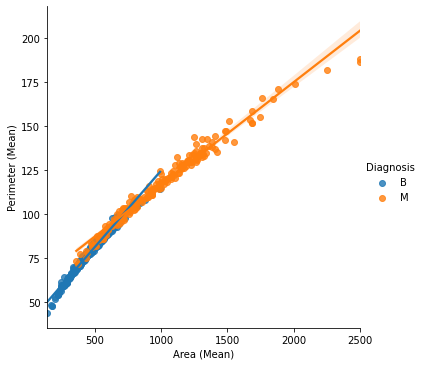

In [301]:
sns.lmplot(data=df, x="Area (Mean)", y="Perimeter (Mean)", hue='Diagnosis')

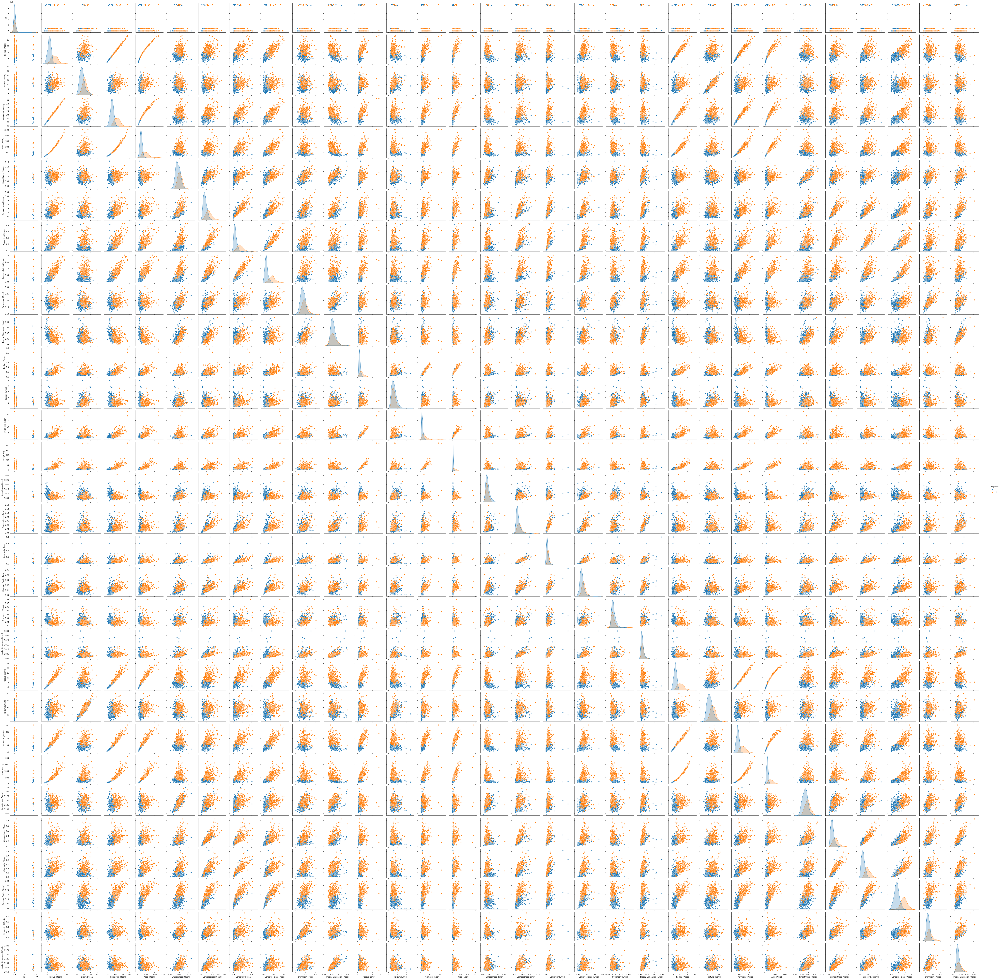

In [192]:
sns.pairplot(data=df, hue="Diagnosis")

In [457]:
import numpy as np
import matplotlib.pyplot as plt

def plot_cluster_graph(X, y_pred, core_samples_mask, algorithm_name, n_clusters, cluster_centres=None):
    
    plt.rcParams.update({'font.size': 12, 'figure.figsize': (12, 9)}) # set font and plot size to be larger

    unique_labels = set(y_pred)

    colors = [plt.cm.rainbow(each) for each in np.linspace(0, 1, len(unique_labels))]
    
    for k, col in zip(unique_labels, colors):
        if k == -1:
            col = [1, 1, 1, 1] # white for noise

        class_member_mask = (y_pred == k)

        xy = X[class_member_mask & core_samples_mask]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
                 markeredgecolor='k', markersize=14)

        xy = X[class_member_mask & ~core_samples_mask]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
                 markeredgecolor='k', markersize=6)

    # plots centroids, if provided
    if cluster_centres is not None:
        plt.plot(cluster_centres[:,0], cluster_centres[:,1], 'o', mew=10, ms=20, alpha=0.5)
    
    plt.title('%s with %d clusters' % (algorithm_name, n_clusters))
    plt.show()

In [458]:
import numpy as np
from sklearn.preprocessing import StandardScaler

X_cancer = df.iloc[:,:len(df.columns)-1]
X_cancer = StandardScaler().fit_transform(X_cancer)

In [459]:
from sklearn.cluster import DBSCAN


db = DBSCAN(eps=4, min_samples=7).fit(X_cancer)
labels = db.labels_

# Number of clusters in labels, ignoring noise (if present)
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

# Create a mask for visualising the core samples in each cluster
# - First creates a NumPy array of False entries
# - Then sets the entries for the core instances to True
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True

# Printing some stats
# can't do all stats as above, as we don't have a ground truth of what clusters 
# each data point should belong to as in the test data
print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)

Estimated number of clusters: 1
Estimated number of noise points: 59


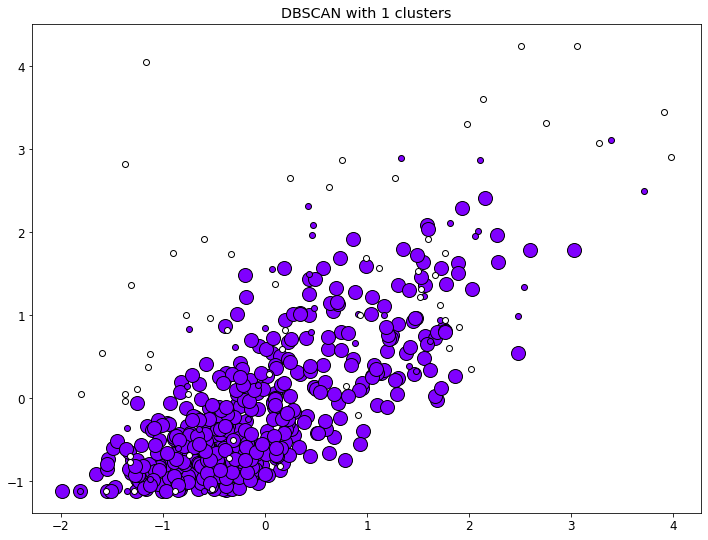

In [475]:
X_cancer = df[["Perimeter (Mean)", "Concavity (Mean)"]]
X_cancer = StandardScaler().fit_transform(X_cancer)
plot_cluster_graph(X_cancer, labels, core_samples_mask, 'DBSCAN', n_clusters_)

In [366]:
print();df[df.isnull().T.any()]

,ID,Radius (Mean),Texture (Mean),Perimeter (Mean),Area (Mean),Smoothness (Mean),Compactness (Mean),Concavity (Mean),Concave Points (Mean),Symmetry (Mean),...,Texture (Worst),Perimeter (Worst),Area (Worst),Smoothness (Worst),Compactness (Worst),Concavity (Worst),Concave Points (Worst),Symmetry (Worst),Fractal Dimension (Worst),Diagnosis
0,842302.0,17.990,10.38,122.80,1001.0,0.11840,0.27760,0.300100,0.147100,0.2419,...,17.33,184.60,2019.0,0.16220,0.66560,0.71190,NaN,0.4601,0.11890,M
10,845636.0,NaN,23.24,102.70,797.8,0.08206,0.06669,0.032990,0.033230,0.1528,...,33.88,123.80,1150.0,0.11810,0.15510,0.14590,0.09975,0.2948,0.08452,M
21,8510824.0,NaN,12.44,60.34,273.9,0.10240,0.06492,0.029560,0.020760,0.1815,...,15.66,65.13,314.9,0.13240,0.11480,0.08867,0.06227,0.2450,0.07773,B
27,852781.0,NaN,20.25,122.10,1094.0,0.09440,0.10660,0.149000,0.077310,0.1697,...,27.26,139.90,1403.0,0.13380,0.21170,0.34460,0.14900,0.2341,0.07421,M
44,85638502.0,NaN,21.81,85.42,531.5,0.09714,0.10470,0.082590,0.052520,0.1746,...,29.89,105.50,740.7,0.15030,0.39040,0.37280,0.16070,0.3693,0.09618,M
67,859465.0,NaN,19.04,71.80,394.1,0.08139,0.04701,0.037090,0.022300,0.1516,...,23.84,78.00,466.7,0.12900,0.09148,0.14440,0.06961,0.2400,0.06641,B
70,859575.0,18.940,21.31,123.60,1130.0,0.09009,0.10290,0.108000,0.079510,0.1582,...,26.58,165.90,1866.0,0.11930,0.23360,0.26870,0.17890,0.2551,NaN,M
90,861648.0,NaN,24.02,94.57,662.7,0.08974,0.08606,0.031020,0.029570,0.1685,...,29.11,102.90,803.7,0.11150,0.17660,0.09189,0.06946,0.2522,0.07246,B
130,866714.0,NaN,13.29,79.08,455.8,0.10660,0.09509,0.028550,0.028820,0.1880,...,17.81,91.38,545.2,0.14270,0.25850,0.09915,0.08187,0.3469,0.09241,B
203,87880.0,NaN,23.75,NaN,NaN,0.13230,NaN,0.155800,0.091760,NaN,...,NaN,128.50,NaN,0.22260,NaN,NaN,NaN,NaN,0.10860,B


In [412]:
df.iloc[549]

ID                              923465
Radius (Mean)                      NaN
Texture (Mean)                     NaN
Perimeter (Mean)                   NaN
Area (Mean)                        NaN
Smoothness (Mean)                  NaN
Compactness (Mean)                 NaN
Concavity (Mean)               0.01548
Concave Points (Mean)          0.00816
Symmetry (Mean)                    NaN
Fractal Dimension (Mean)           NaN
Radius (Error)                  0.5196
 Texture (Error)                 1.918
 Perimeter (Error)               3.564
 Area (Error)                      NaN
 Smoothness (Error)                NaN
 Compactness (Error)            0.0187
 Concavity (Error)             0.01277
 Concave Points (Error)       0.005917
 Symmetry (Error)                  NaN
 Fractal Dimension (Error)         NaN
 Radius (Worst)                    NaN
 Texture (Worst)                   NaN
 Perimeter (Worst)                 NaN
 Area (Worst)                      NaN
 Smoothness (Worst)      

## Processing the dataset

First, you need to clean the data.

In [26]:
# TODO: your own data cleaning, e.g., dealing with the missing values and converting the feature column (to numeric)
from sklearn import preprocessing
import pandas as pd

def Machine_Featute_Numeric_():

    df = pd.read_csv('data/breast-cancer.csv', column = ['Diagnosis'])
print(); 

le = preprocessing.LabelEncoder()

le.fit(df['Diagnosis'])

print(); print(list(le.classes_))

print(); (le.transform(df['Diagnosis']))





['B', 'M']



array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1,
       0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1,
       0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1,
       1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0,
       0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1,
       1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1,

### Preparing the X and y arrays in preparation for running the machine learning classifier below

## Running Machine Learning classifier

You should replace some code indicated below to import, load and run your own classifier.

Literally just two lines where you need to update the code. Otherwise, this should be able to run your classifier, to demonstrate that it is working and running properly against the dataset provided.

In [27]:
from sklearn import preprocessing

# Splits the Pandas DataFrame into a feature matrix (X) and class/label vector (y)
X = df.iloc[:,:len(df.columns)-1]
y = df.iloc[:,len(df.columns)-1]

# Transform class labels to numeric labels
le = preprocessing.LabelEncoder()
le.fit(y)
y = le.transform(y)

In [68]:
from sklearn.model_selection import train_test_split

# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split (X, y, test_size=0.30, random_state=1000) # 70% training and 30% test

In [69]:
from sklearn.neighbors import KNeighborsClassifier

#Create KNN Classifier
knn = KNeighborsClassifier(n_neighbors=5)

#Train the model using the training sets
knn.fit(X_train, y_train)

#Predict the response for test dataset
y_pred = knn.predict(X_test)

In [70]:
#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics
from sklearn.metrics import f1_score
# Model Accuracy
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Precision:",metrics.precision_score(y_test, y_pred, average="weighted"))
print("Recall:",metrics.recall_score(y_test, y_pred, average="weighted"))
print("F-1 Score:",f1_score(y_test, y_pred, average='micro'))

Accuracy: 0.7543859649122807
Precision: 0.7644843816859223
Recall: 0.7543859649122807
F-1 Score: 0.7543859649122807


In [60]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test, y_pred)


array([[96,  8],
       [34, 33]])

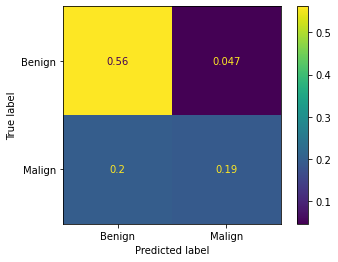

In [63]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred, normalize='all')
cmd = ConfusionMatrixDisplay(cm, display_labels=['Benign','Malign'])
cmd.plot()

In [2]:
# NOTE THAT THIS IS JUST AN EXAMPLE WITH THE RANDOM CLASSIFIER
# THIS SHOULD BE REPLACED WITH RUNNING YOUR OWN CLASSIFIER (FROM A PYTHON FILE)
# PS: you need to restart the notebook to load changes to python files used (like the random_classifier here)

import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn import metrics
from classifier import my_classifier     # REPLACE WITH IMPORT FOR YOUR CLASSIFIER

# arrays for storing performance metrics
accuracy_list = np.array([])
precision_list = np.array([])
recall_list = np.array([])

# sets the number of runs of hold-out validation below (from which we get statistics)
n = 100

for x in range(n):
    # Hold-out validation - 80% training and 20% testing
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=None)
    
    # Creating the model, training and testing it
    model = my_classifier.MyClassifier() # REPLACE WITH YOUR CLASSIFIER
    model = model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    # Appending performance metrics to arrays created above
    accuracy_list = np.append(accuracy_list, metrics.accuracy_score(y_test, y_pred))
    precision_list = np.append(precision_list, metrics.precision_score(y_test, y_pred, average='macro', zero_division=0))
    recall_list = np.append(recall_list, metrics.recall_score(y_test, y_pred, average='macro', zero_division=0))

# printing out the performance metrics (mean + standard deviation)
print("Accuracy:  %0.2f (+/- %0.2f)" % (accuracy_list.mean(), accuracy_list.std() * 2))
print("Precision: %0.2f (+/- %0.2f)" % (precision_list.mean(), precision_list.std() * 2))
print("Recall:    %0.2f (+/- %0.2f)" % (recall_list.mean(), recall_list.std() * 2))

# plotting a histogram of the performance metrics
plt.figure()
plt.hist(accuracy_list, bins=50, alpha=0.5, label='accuracy')
plt.hist(precision_list, bins=50, alpha=0.5, label='precision')
plt.hist(recall_list, bins=50, alpha=0.5, label='recall')
plt.legend(loc='upper right')
plt.xlabel('Performance (metric value)')
plt.ylabel('Frequency')
plt.show()

NameError: name 'X' is not defined